**Lab 4: FIR filters and envelopes**

The goal of this lab is to learn how to implement FIR filters in Python, and how we can use them to improve our synthesis.

In [181]:
import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram, save_audio
from IPython.display import Audio

**1. Overview of Filtering**

For this lab, we will define an FIR filter as a discrete-time system that converts an input signal $x[n]$ into an output signal $y[n]$ by means of the weighted summation:

$$
y[n] = \sum_{k=0}^M b_kx[n-k]
$$

The function *np.convolve()* is a generic function with which to implement FIR filters. The following code implements a three-point averaging system:

In [182]:
fs = 1
x = [np.floor(x/10) for x in range(50)]
b = np.array([1.0/3, 1.0/3, 1.0/3])
y = np.convolve(b, x)

plot_signals([x, y], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

1.1 Explain the filtering action of the 5-point averager by comparing the plot of the input $x[n]$ and the output $y[n]$. This filter might be called a “smoothing” filter. Note how the transitions from one level to another have been “smoothed.”

El filtre de mitjana de 5 punts actua com un suavitzador: cada mostra de sortida és la mitjana de la mostra actual i les quatre anteriors. Això fa que els canvis sobtats en el senyal d’entrada es transformin en transicions més graduals en la sortida. Al gràfic, es veu clarament que el senyal filtrat (sortida) té angles menys pronunciats i les escales entre nivells duren més temps. En resum, el senyal és més suau i es veu menys afectat pel soroll o per variacions brusques.

*1.2* Define a function `averaging_filter(x, N)` which implements the N-points averaging filter using the `np.convolve` function.

In [183]:
import numpy as np

def averaging_filter(x, N):
    """
    Applies a N-point averaging filter to the input signal x

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the filter
    """
    
    # Coeficients del filtre: N valors iguals que sumen 1
    b = np.ones(N) / N

    # Aplicació del filtre FIR amb convolució
    y = np.convolve(x, b, mode="full")

    return y

1.3 Run the example above using the `averaging_filter` instead. Change the number N to different values and explain what happen.

In [184]:
# Prova amb diferents valors de N
for N in [2, 5, 8]:
    y = averaging_filter(x, N)  # Reutilitzem la funció d'entrada anterior
    print(f"Filtre de {N} punts")
    plot_signals([x, y], fs, name=['input x[n]', 'output y[n]'], mode='lines+markers')

Filtre de 2 punts


Filtre de 5 punts


Filtre de 8 punts


En aquests tres gràfics es pot observar que, contra més gran és N i contra més punts té el filtre de mitjana, més suau és el senyal de sortida i menys brusques són les transicions. Es pot veure clarament com les variacions tenen graus més aguts i duren més temps en el senyal de sortida del filtre amb més punts.

1.4 How would you classify this filter, as a low-pass o high-pass filter?

Aquest filtre s’ha de classificar com un filtre 'low-pass'. Com s'ha pogut observar anteriorment, la mitjana de diversos punts suavitza el senyal, reduint les variacions ràpides i el soroll d’alta freqüència. Això fa que les components de baixa freqüència passin amb més facilitat, mentre que les altes es redueixen. Per això, no és un filtre 'high-pass' sino que és un filtre 'low-pass'.

---

**2. Envelope detector**

Now we'll implement an envelope detector by concatenating two systems: a full-wave rectifier (absolute value) and the N-point averaging filter.

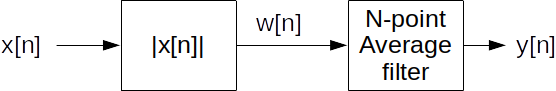

2.1 Define a function `envelope(x, N)` which applies an N-point averaging filter to the full-wave rectified signal and returns the output $y[n]$.

**Note 1**: to calculate the full-wave rectified signal check the `np.abs()` function.

**Note 2**: The output should have the same length as the input signal. Use 'same' mode (see [np.convolve](https://numpy.org/doc/stable/reference/generated/numpy.convolve.html) documentation).

In [185]:
import numpy as np

def envelope(x, N):
    """
    Extracts the envelope of the input signal x by concatenating a full-wave rectifier and an N-point averaging filter.

    Parameters
    ----------
    x : np.array
        The input signal in the form of a numpy array
    N : int
        The number of points used in N-point averaging filter

    Returns
    -------
    y : np.array
        The output of the system, i.e., the envelope of the signal x.
    """
    
    # Rectificació de valor absolut (full-wave rectifier)
    x_rectified = np.abs(x)

    # Coeficients del filtre de mitjana
    b = np.ones(N) / N

    # Aplicació del filtre FIR amb mode 'same'
    y = np.convolve(x_rectified, b, mode='same')

    return y


2.2 Load your reference signal and calculate its envelope using the function you designed. Plot the reference signal and envelope in the same figure.

In [186]:
# Carreguem el senyal de referència
reference, fs = load_audio('audio/reference.wav')

# Paràmetre del filtre (nombre de punts per a la mitjana)
N = 10

# Càlcul de l’envolvent
env = envelope(reference, N)

# Representació del senyal i la seva envolvent
plot_signals([reference, env], fs, t_start=0, t_end=2, name=['Senyal de referència', 'Envolvent'], mode='lines')


2.3 Change the number N to get a good result. What happens when you change the number N?

In [187]:
# Probem un nombre N més petit per obtindre millor resultat
N = 3

# Càlcul de l’envolvent
env = envelope(reference, N)

# Representació del senyal i la seva envolvent
plot_signals([reference, env], fs, t_start=0, t_end=2, name=['Senyal de referència', 'Envolvent'], mode='lines')

Comparant els dos gràfics anteriors es pot observar que contra més petit és el nombre de punts per fer la mitjana, més semblant és l'envolvent al senyal de referència. Si el nombre de punts és major, s'agafen més mostres i això provoca que l'output del punt concret sigui més diferent al punt del senyal d'entrada. Ara bé, si el nombre N és molt petit, l'envolvent segueix massa de prop les ascil·laciions del senyal i no filtra prou.

2.4 Explain with your own words why this system achieves extracting the envelope. It might be useful to plot together the signals $x[n]$, $w[n]$ and $y[n]$.

In [188]:
# Senyal original
x = reference
N = 5

# Rectificació
w = np.abs(x)

# Envolvent
y = envelope(x, N)

# Representació conjunta dels senyals x[n], w[n] i y[n]
plot_signals([x, w, y], fs, name=['x[n] (original)', 'w[n] = |x[n]|', 'y[n] = envolvent'], mode='lines')


Aquest sistema extreu l’envolvent perquè primer converteix totes les oscil·lacions en valors positius (amb el valor absolut), i després aplica una mitjana que suavitza les variacions ràpides. Això elimina les oscil·lacions d’alta freqüència i deixa només la forma general de l’amplitud del senyal, que és just el que volem com a envolvent.

2.5 Now let's apply this envelope to the synthesized signal. Copy the code from Lab3 Ex. 2.1 and generate the synthesized signal. Then multiply the synthesized signal by the envelope. Note that both signal and envelope should have the same length. You can define a time vector of the same length of the envelope to create the signal:

In [189]:
# Definim un altre cop la funció synthesize
def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

# Carreguem el senyal de referència
reference, fs = load_audio('audio/reference.wav')

# Paràmetres del senyal sintetitzat
f0 = 915.16                     # freqüència fonamental
phi = -np.pi / 2                # fase inicial
A_ref = 0.13                    # amplitud de referència
duration = len(reference) / fs # duració basada en el senyal de referència
t = np.linspace(0, duration, len(reference))  # vector de temps

# Amplituds relatives mesurades (fins al 7è harmònic)
Ak = [1, 0.6, 0.06, 0.03, 0.03, 0.007, 0.003]

# Generem el senyal sintetitzat
synth = synthesize(f0, phi, Ak, t)

# Calculem l’envolvent del senyal de referència
N_env = 40
env = envelope(reference, N_env)

# Apliquem l’envolvent al senyal sintetitzat
synth *= env

# Normalització del senyal
synth = A_ref * synth / np.max(np.abs(synth))

# Comparació amb el senyal de referència
plot_signals([reference, synth], fs, t_start=0, t_end=duration,
             name=['Referència', 'Senyal sintetitzat amb envolvent'])

2.6. Compare the spectrograms of the reference signal and the synthesized signal. What are the main differences?

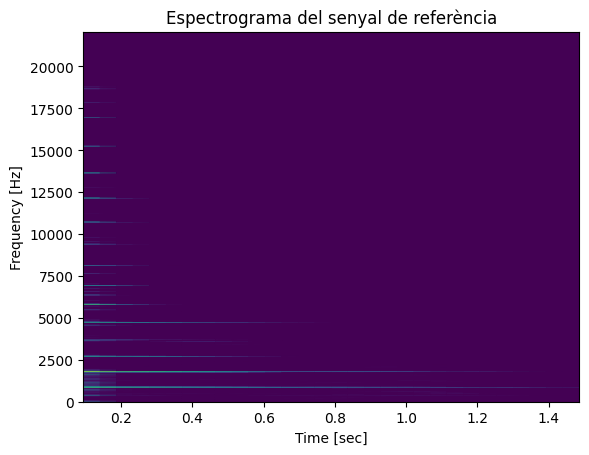

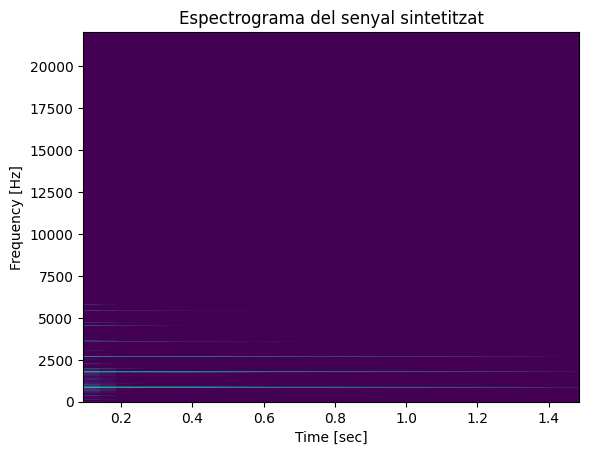

In [190]:
from scipy.signal import spectrogram

# Càlcul de l’espectrograma del senyal de referència
window_length = 8192
ff, tt, S = spectrogram(reference, fs=fs, nperseg=window_length, noverlap=window_length/2)
plot_spectrogram(ff, tt, S)
plt.title('Espectrograma del senyal de referència')
plt.show()

# Càlcul de l’espectrograma del senyal sintetitzat
ff, tt, S = spectrogram(synth, fs=fs, nperseg=window_length, noverlap=window_length/2)
plot_spectrogram(ff, tt, S)
plt.title('Espectrograma del senyal sintetitzat')
plt.show()


L’espectrograma del senyal de referència mostra una estructura més rica i difusa, amb harmònics que varien en amplitud i la presència de components no estrictament harmòniques. En canvi, el senyal sintetitzat presenta línies espectrals més netes i estables, amb menys variabilitat temporal.

També podem observar com l'envolvent aplicada no pot reproduir tota la complexitat espectral del senyal real, especialment les ressonàncies i el soroll.

2.7 Listen to the synthesized signal and compare it to the reference.



In [191]:
# Escoltem l'audio sintetitzat
Audio(synth,rate=fs)

In [192]:
# Guardem el so sintetitzat
save_audio("audio/synthetizised_signal.wav", synth, fs)

In [193]:
# Escoltem el so referència per comparar
Audio(reference, rate=fs)

El senyal sintetitzat s’apropa força al timbre del senyal de referència gràcies a l’estructura harmònica i l’envolvent temporal. Tot i això, es nota que és més net i idealitzat: li falta part de la textura, ressonància i variabilitat natural del senyal real. La síntesi captura bé la forma global, però no tota la complexitat acústica.